In [2]:
# importing important modules
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

from matplotlib import *
import seaborn as sns

In [3]:
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint

In [4]:
# read the ask and bid datasets
df_2023_ask = pd.read_csv('XAGUSD_5 Mins_Ask_2023.01.01_2023.06.30.csv')
df_2023_bid = pd.read_csv('XAGUSD_5 Mins_Bid_2023.01.01_2023.06.30.csv')

In [5]:
# merge the ask and bid datasets
df_2023 = df_2023_bid.merge(df_2023_ask, left_on='Time (UTC)', right_on='Time (UTC)', how='outer', suffixes=('_Bid', '_Ask'))
df_2023

,Time (UTC),Open_Bid,High_Bid,Low_Bid,Close_Bid,Volume _Bid,Open_Ask,High_Ask,Low_Ask,Close_Ask,Volume _Ask
0,2023.01.02 23:00:00,24.036,24.059,24.017,24.059,0.3480,24.102,24.125,24.083,24.125,0.3510
1,2023.01.02 23:05:00,24.064,24.130,24.064,24.092,1.8458,24.094,24.188,24.094,24.141,1.1550
2,2023.01.02 23:10:00,24.094,24.098,23.972,23.977,0.9030,24.143,24.148,24.022,24.027,0.8820
3,2023.01.02 23:15:00,23.977,23.980,23.938,23.980,0.8940,24.026,24.028,23.986,24.028,0.8940
4,2023.01.02 23:20:00,23.978,24.024,23.976,24.023,0.8880,24.026,24.073,24.023,24.073,0.9044
...,...,...,...,...,...,...,...,...,...,...,...
35215,2023.06.30 20:35:00,22.752,22.752,22.741,22.746,0.2752,22.782,22.782,22.771,22.776,1.8002
35216,2023.06.30 20:40:00,22.736,22.751,22.736,22.746,0.1410,22.775,22.781,22.775,22.776,0.7568
35217,2023.06.30 20:45:00,22.751,22.751,22.746,22.746,0.0690,22.781,22.781,22.776,22.776,0.4212
35218,2023.06.30 20:50:00,22.746,22.761,22.736,22.756,0.2160,22.776,22.797,22.774,22.786,0.6836


In [6]:
#  to rename specific columns, because volume_bid and volume_ask has space
df_2023.rename(columns={'Volume _Ask': 'Volume_Ask'}, inplace=True)
df_2023.rename(columns={'Volume _Bid': 'Volume_Bid'}, inplace=True)

In [7]:
# convert the Time (UTC) column o datetime format
df_2023['Local_time_T'] = pd.to_datetime(df_2023['Time (UTC)'], utc=True)
df_2023=df_2023.drop(['Time (UTC)'], axis=1)
df_2023.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35220 entries, 0 to 35219
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   Open_Bid      35220 non-null  float64            
 1   High_Bid      35220 non-null  float64            
 2   Low_Bid       35220 non-null  float64            
 3   Close_Bid     35220 non-null  float64            
 4   Volume_Bid    35220 non-null  float64            
 5   Open_Ask      35220 non-null  float64            
 6   High_Ask      35220 non-null  float64            
 7   Low_Ask       35220 non-null  float64            
 8   Close_Ask     35220 non-null  float64            
 9   Volume_Ask    35220 non-null  float64            
 10  Local_time_T  35220 non-null  datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](1), float64(10)
memory usage: 3.2 MB


In [8]:
# delta columns show how each minute the prices differ between the bid and ask
# the volume delta columns
df_2023["Volume_Delta"] = df_2023["Volume_Ask"] - df_2023["Volume_Bid"]
df_2023["Volume_Delta_abs"] = (df_2023["Volume_Ask"] - df_2023["Volume_Bid"]).abs()

# the price delta columns
df_2023["Open_Delta"] = df_2023["Open_Ask"]  - df_2023["Open_Bid"]
df_2023["High_Delta"] = df_2023["High_Ask"]  - df_2023["High_Bid"]
df_2023["Low_Delta"]  = df_2023["Low_Ask"]   - df_2023["Low_Bid"]
df_2023["Close_Delta"]= df_2023["Close_Ask"] - df_2023["Close_Bid"]

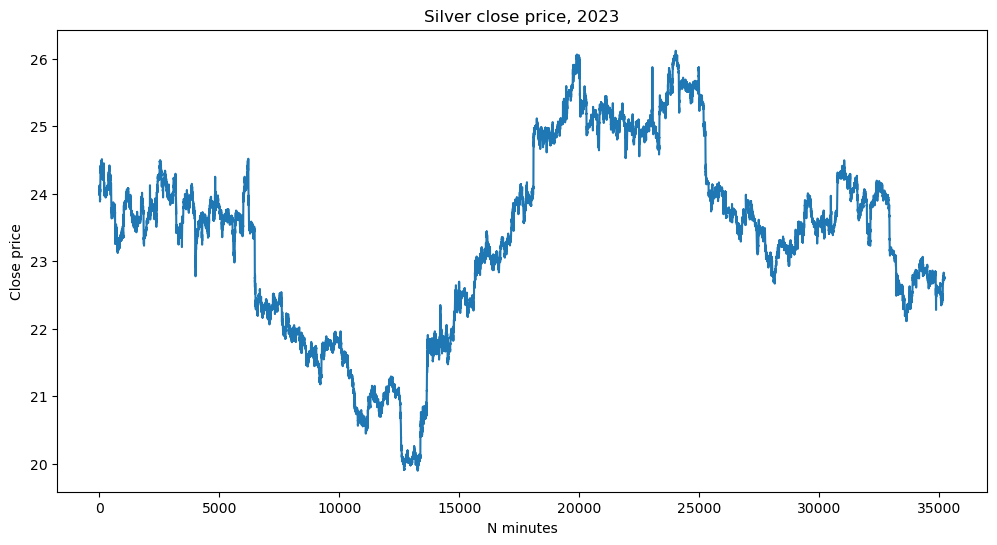

In [9]:
# plotting some price graphs
plt.figure(figsize=(12,6))
plt.plot(df_2023['Close_Bid'])
plt.title('Silver close price, 2023')
plt.xlabel('N minutes')
plt.ylabel('Close price')
plt.show()

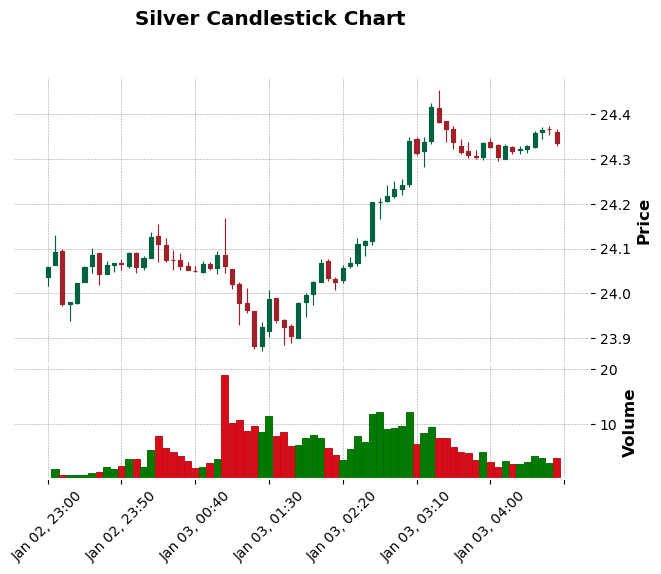

In [10]:
# preparing data for candlestick chart
data_chart = df_2023.set_index('Local_time_T', inplace=False)

# dropping all columns except the bid prices and volume
data_chart = data_chart.drop(['Open_Ask','High_Ask','Low_Ask','Close_Ask','Volume_Ask', 'Volume_Delta', 'Volume_Delta_abs', 
                        'Open_Delta', 'High_Delta', 'Low_Delta', 'Close_Delta'],axis=1)
# graphing the candestick for bid prices in next 70 minute
import mplfinance as mpf

data_chart.columns = ['Open', 'High', 'Low', 'Close', 'Volume']
mpf.plot(data_chart.iloc[0:70], type='candle', style='charles', title='Silver Candlestick Chart', volume=True)

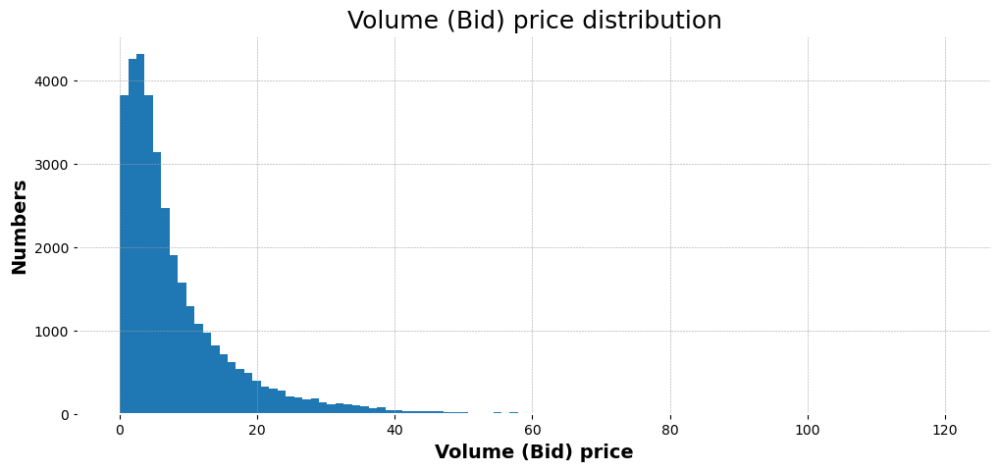

In [11]:
# plotting volume bid graph
plt.figure(num=1,figsize=(12,5))
plt.hist(df_2023['Volume_Bid'],bins=100)
plt.title('Volume (Bid) price distribution',size=18)
plt.ylabel('Numbers',size=14)
plt.xlabel('Volume (Bid) price',size=14);

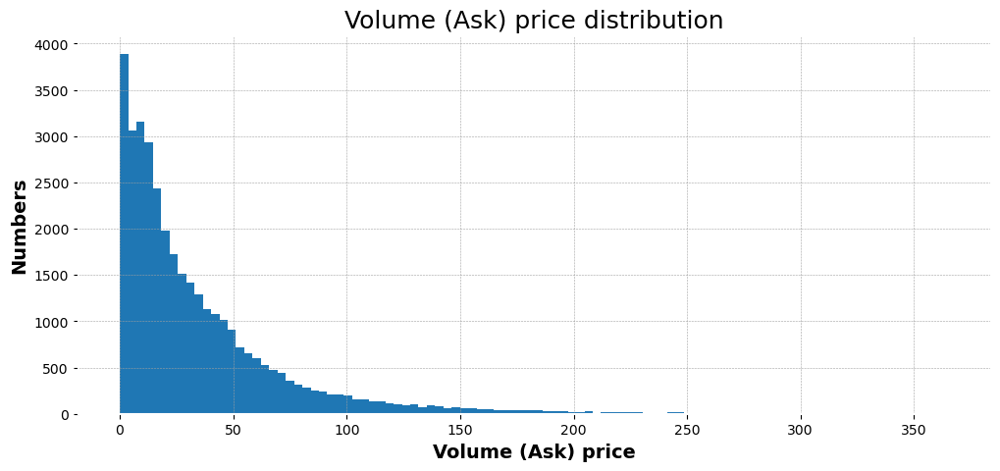

In [12]:
# plotting volume ask graph
plt.figure(num=1,figsize=(12,5))
plt.hist(df_2023['Volume_Ask'],bins=100)
plt.title('Volume (Ask) price distribution',size=18)
plt.ylabel('Numbers',size=14)
plt.xlabel('Volume (Ask) price',size=14);

In [13]:
# plotting the volume bid and ask but in different way
# df_2023.plot.scatter(x='Volume_Bid', y='Volume_Ask');

# ------------------------------------------------------------------------
# different way for plotting volume ask and bid together

import cufflinks as cf
cf.go_offline()

df_2023[['Volume_Ask', 'Volume_Bid']].iplot(
                            kind='hist',
                            histnorm='percent',
                            barmode='overlay',
                            xTitle='Volume distribution',
                            yTitle='Numbers',
                            title='Volume')

In [14]:
# to plot more than one column/multiple column in one plot
df_2023[['Open_Delta', 'High_Delta', 'Low_Delta', 'Close_Delta']].iplot(
                                                                    kind = 'box',
                                                                    yTitle = 'Delta',
                                                                    title = 'Deltas')

In [15]:
# to plot a graph for a specific part of time

# plot the part of the whole dataset using iplot()
# The time period equals 400 minutes: from 19800 to 20200

df_2023.iloc[19800:20200,:][['High_Bid', 'Low_Bid', 'Local_time_T', 'Volume_Ask','Volume_Bid']].iplot(
                                                x='Local_time_T', y=['High_Bid', 'Low_Bid'], 
                                                mode='lines+markers', 
                                                xTitle='Date', yTitle='Price',
                                                title='GOLD ')

In [16]:
# create the new_year and new_week columns


# shift the time down 1 row in a new column

df_2023['Local_time_T_shipt_1_Down'] = df_2023['Local_time_T'].shift(1)


df_2023["Local_time_T_Delta"] = df_2023['Local_time_T'] - df_2023['Local_time_T_shipt_1_Down']

# The start of the year is the start of a week
# Therefore, we change the time interval to 2 days (the duration of the weekend).

df_2023['Local_time_T_Delta'].iloc[0] = "2 days 01:01:00"
df_2023['Local_time_T_Delta'].iloc[0]

# We found the duration of night intervals when there is no trading in Gold.
# Total such intervals - 258, which is equal to the number of trading days in 2022 year


new_day = df_2023[['Local_time_T_Delta']][df_2023['Local_time_T_Delta'] > '0 days 00:01:00']



# We found the weekend duration when there was no trading in Gold.
# Total intervals - 52, which is equal to the number of weekends in the 2022 year

new_week = df_2023[df_2023['Local_time_T_Delta'] > '1 days 00:00:00']


df_2023['New_day'] = 0
df_2023['New_week'] = 0

df_2023.loc[df_2023['Local_time_T_Delta'] > '0 days 00:01:00', 'New_day'] = 1

df_2023[df_2023['New_day'] == 1]

df_2023.loc[df_2023['Local_time_T_Delta'] > '1 days 00:00:00', 'New_week'] = 1

df_2023[df_2023['New_week'] == 1]

# drop the columns that are no longer needed, 
# since the time series is regular 
# (each line is the next minute, except for the marked lines in the New_day and New_week columns

data2 = df_2023.drop(['Local_time_T', 'Local_time_T_shipt_1_Down', 'Local_time_T_Delta'],axis=1)

In [17]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35220 entries, 0 to 35219
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Open_Bid          35220 non-null  float64
 1   High_Bid          35220 non-null  float64
 2   Low_Bid           35220 non-null  float64
 3   Close_Bid         35220 non-null  float64
 4   Volume_Bid        35220 non-null  float64
 5   Open_Ask          35220 non-null  float64
 6   High_Ask          35220 non-null  float64
 7   Low_Ask           35220 non-null  float64
 8   Close_Ask         35220 non-null  float64
 9   Volume_Ask        35220 non-null  float64
 10  Volume_Delta      35220 non-null  float64
 11  Volume_Delta_abs  35220 non-null  float64
 12  Open_Delta        35220 non-null  float64
 13  High_Delta        35220 non-null  float64
 14  Low_Delta         35220 non-null  float64
 15  Close_Delta       35220 non-null  float64
 16  New_day           35220 non-null  int64 

In [18]:
# reduce the intgere column memory size
column_integer = ['New_day', 'New_week']
columns_float =['Open_Bid', 'High_Bid', 'Low_Bid', 'Close_Bid', 
                'Volume_Bid','Open_Ask','High_Ask','Low_Ask','Close_Ask', 'Volume_Ask', 'Volume_Delta', 'Volume_Delta_abs', 
                'Open_Delta', 'High_Delta', 'Low_Delta', 'Close_Delta']
for column in column_integer:
    data2[column] = pd.to_numeric(data2[column], downcast='integer')
    
for column in columns_float:
    data2[column] = pd.to_numeric(data2[column], downcast='float')
    
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35220 entries, 0 to 35219
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Open_Bid          35220 non-null  float32
 1   High_Bid          35220 non-null  float32
 2   Low_Bid           35220 non-null  float32
 3   Close_Bid         35220 non-null  float32
 4   Volume_Bid        35220 non-null  float32
 5   Open_Ask          35220 non-null  float32
 6   High_Ask          35220 non-null  float32
 7   Low_Ask           35220 non-null  float32
 8   Close_Ask         35220 non-null  float32
 9   Volume_Ask        35220 non-null  float32
 10  Volume_Delta      35220 non-null  float32
 11  Volume_Delta_abs  35220 non-null  float32
 12  Open_Delta        35220 non-null  float32
 13  High_Delta        35220 non-null  float32
 14  Low_Delta         35220 non-null  float32
 15  Close_Delta       35220 non-null  float32
 16  New_day           35220 non-null  int8  

In [19]:
# create the Y column (high bid, low ask)
data2['Y_High_Bid'] = data2['High_Bid']
data2['Y_Low_Ask'] = data2['Low_Bid'] + data2['Low_Delta']

In [20]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35220 entries, 0 to 35219
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Open_Bid          35220 non-null  float32
 1   High_Bid          35220 non-null  float32
 2   Low_Bid           35220 non-null  float32
 3   Close_Bid         35220 non-null  float32
 4   Volume_Bid        35220 non-null  float32
 5   Open_Ask          35220 non-null  float32
 6   High_Ask          35220 non-null  float32
 7   Low_Ask           35220 non-null  float32
 8   Close_Ask         35220 non-null  float32
 9   Volume_Ask        35220 non-null  float32
 10  Volume_Delta      35220 non-null  float32
 11  Volume_Delta_abs  35220 non-null  float32
 12  Open_Delta        35220 non-null  float32
 13  High_Delta        35220 non-null  float32
 14  Low_Delta         35220 non-null  float32
 15  Close_Delta       35220 non-null  float32
 16  New_day           35220 non-null  int8  

In [21]:
data2.describe()

,Open_Bid,High_Bid,Low_Bid,Close_Bid,Volume_Bid,Open_Ask,High_Ask,Low_Ask,Close_Ask,Volume_Ask,Volume_Delta,Volume_Delta_abs,Open_Delta,High_Delta,Low_Delta,Close_Delta,New_day,New_week,Y_High_Bid,Y_Low_Ask
count,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.0,35220.000000,35220.000000,35220.000000
mean,23.357347,23.374672,23.338356,23.357330,8.283237,23.387552,23.404936,23.368742,23.387426,35.095169,26.812130,26.908604,0.030226,0.030227,0.030280,0.030149,1.0,0.000738,23.374672,23.368742
std,1.368781,1.368824,1.368924,1.368864,8.976384,1.368775,1.368801,1.368945,1.368856,39.024876,33.422531,33.344856,0.003245,0.003380,0.005014,0.003851,0.0,0.027161,1.368824,1.368945
min,19.893000,19.914000,19.888000,19.893000,0.000000,19.923000,19.944000,19.917999,19.923000,0.000000,-48.791199,0.000000,0.011000,0.018000,0.001000,0.012000,1.0,0.000000,19.914000,19.918001
25%,22.421751,22.440001,22.400000,22.421000,2.611050,22.452000,22.469999,22.430000,22.451000,9.467675,5.170550,5.237100,0.030000,0.030000,0.030000,0.030000,1.0,0.000000,22.440001,22.430000
50%,23.559999,23.576000,23.542999,23.559999,5.331100,23.590000,23.607000,23.573000,23.590000,22.237451,14.907800,14.937300,0.030000,0.030000,0.030000,0.030000,1.0,0.000000,23.576000,23.573000
75%,24.122000,24.143999,24.103001,24.122000,10.686275,24.153000,24.174000,24.132999,24.152000,46.639375,36.154925,36.159175,0.030000,0.030000,0.030000,0.030000,1.0,0.000000,24.143999,24.133001
max,26.118000,26.122999,26.098000,26.118000,120.651703,26.148001,26.153000,26.128000,26.148001,365.632202,317.585785,317.585785,0.185000,0.222000,0.409000,0.309000,1.0,1.000000,26.122999,26.128000


In [22]:
# separate the data into train and test data

# here we divide only the training set(80%) for the calculation of normalisation parameters
# The division into validation and training sets will be done immediately before training

data_length = len(df_2023)

train_size = int(round(data_length*0.8, -3))
train_size

train = data2.iloc[:train_size]

# Max price is Max High_Ask = High_Bid + High_Delta
# Min price is Min Low_Bid

# Max Volume = Max{Volume_Bid, Volume_Ask}
# Min Volume = 0

# Max_Delta = Max{Open_Delta, High_Delta, Low_Delta, Close_Delta}
# Min_Delta = Min{Open_Delta, High_Delta, Low_Delta, Close_Delta}


max_price = (train['High_Bid'] + train['High_Delta']).max()
max_price


min_price = train['Low_Bid'].min()
min_price

max_volume = max(max(train['Volume_Bid']), max(train['Volume_Ask']))
max_volume

max_delta = max(max(train['Open_Delta']), max(train['High_Delta']), max(train['Low_Delta']), max(train['Close_Delta']))
max_delta

max_delta = round(max_delta, 3)
max_delta

min_delta = min(min(train['Open_Delta']), min(train['High_Delta']), min(train['Low_Delta']), min(train['Close_Delta']))
min_delta

min_delta = round(min_delta,3)
min_delta

max_volume_delta = train['Volume_Delta'].max()
max_volume_delta

min_volume_delta = train['Volume_Delta'].min()
min_volume_delta


max_volume_delta_abs = train['Volume_Delta_abs'].max()
max_volume_delta_abs

min_volume_delta_abs = train['Volume_Delta_abs'].min()
min_volume_delta_abs



# min_volume_Delta_abs = 0
# Therefore, the normalization formula for volume_Delta_abs is simplified

data2['Open_Bid'] = ( data2['Open_Bid'] - min_price ) / (max_price-min_price)
data2['High_Bid']  = ( data2['High_Bid']  - min_price ) / (max_price-min_price)
data2['Low_Bid']   = ( data2['Low_Bid']   - min_price ) / (max_price-min_price)
data2['Close_Bid'] = ( data2['Close_Bid'] - min_price ) / (max_price-min_price)
data2['Y_High_Bid'] = ( data2['Y_High_Bid'] - min_price ) / (max_price-min_price)
data2['Y_Low_Ask']  = ( data2['Y_Low_Ask']  - min_price ) / (max_price-min_price)


data2['Volume_Ask']  = data2['Volume_Ask'] / max_volume
data2['Volume_Bid']  = data2['Volume_Bid'] / max_volume

data2['Volume_Delta'] = ( data2['Volume_Delta'] - min_volume_delta ) / (max_volume_delta-min_volume_delta)


data2['Volume_Delta_abs']  = data2['Volume_Delta_abs'] / max_volume_delta_abs

# For the price deltas, the minimum difference is more interesting, therefore we apply inverse normalisation
# data= 1 - (data - data.min()) / (data.max() - data.min()) = (data.max() - data) / (data.max() - data.min())

data2['Open_Delta']  = ( max_delta - data2['Open_Delta'] )  / (max_delta-min_delta)
data2['High_Delta']  = ( max_delta - data2['High_Delta'] )  / (max_delta-min_delta)
data2['Low_Delta']   = ( max_delta - data2['Low_Delta'] )   / (max_delta-min_delta)
data2['Close_Delta'] = ( max_delta - data2['Close_Delta'] ) / (max_delta-min_delta)

In [23]:
data2.describe()

,Open_Bid,High_Bid,Low_Bid,Close_Bid,Volume_Bid,Open_Ask,High_Ask,Low_Ask,Close_Ask,Volume_Ask,Volume_Delta,Volume_Delta_abs,Open_Delta,High_Delta,Low_Delta,Close_Delta,New_day,New_week,Y_High_Bid,Y_Low_Ask
count,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.000000,35220.0,35220.000000,35220.000000,35220.000000
mean,0.553769,0.556523,0.550750,0.553768,0.022654,23.387552,23.404936,23.368742,23.387426,0.095986,0.206354,0.084729,0.905439,0.905435,0.905258,0.905693,1.0,0.000738,0.556523,0.555577
std,0.218480,0.218488,0.218504,0.218494,0.024550,1.368775,1.368801,1.368945,1.368856,0.106733,0.091225,0.104995,0.010539,0.010978,0.016277,0.012507,0.0,0.027161,0.218488,0.218507
min,0.000798,0.004150,0.000000,0.000798,0.000000,19.923000,19.944000,19.917999,19.923000,0.000000,0.000000,0.000000,0.402597,0.282467,-0.324675,0.000000,1.0,0.000000,0.004150,0.004789
25%,0.404429,0.407342,0.400958,0.404310,0.007141,22.452000,22.469999,22.430000,22.451000,0.025894,0.147285,0.016490,0.905844,0.905844,0.905844,0.905844,1.0,0.000000,0.407342,0.405746
50%,0.586113,0.588667,0.583400,0.586113,0.014580,23.590000,23.607000,23.573000,23.590000,0.060819,0.173862,0.047034,0.905844,0.905844,0.905844,0.905844,1.0,0.000000,0.588667,0.588188
75%,0.675818,0.679329,0.672785,0.675818,0.029227,24.153000,24.174000,24.132999,24.152000,0.127558,0.231854,0.113856,0.905844,0.905844,0.905844,0.905844,1.0,0.000000,0.679329,0.677574
max,0.994413,0.995211,0.991221,0.994413,0.329981,26.148001,26.153000,26.128000,26.148001,1.000000,1.000000,1.000000,0.967532,0.944805,1.000000,0.964286,1.0,1.000000,0.995211,0.996010


In [24]:
# create an input feature and output 
# the input features
data_ax = data2.drop(['Y_High_Bid', 'Y_Low_Ask'], axis=1)
# output
data_ay = data2[['Y_High_Bid', 'Y_Low_Ask']]

print(data_ax.shape)
print(data_ay.shape)

(35220, 18)
(35220, 2)


In [25]:
# shift the data_ay, the array of answers, one minute up
data_ay = data_ay.shift(-1)

# create window to get max and min prices in next 5 min

# Forward-looking window
indexer = pd.api.indexers.FixedForwardWindowIndexer(window_size=5)

data_ay['Y_High_Bid_5'] = data_ay['Y_High_Bid'].rolling(window=indexer).max()
data_ay['Y_Low_Ask_5']  = data_ay['Y_Low_Ask'].rolling(window=indexer).min()

In [26]:
# drop the high bid and low ask before 5 min 
data_ay = data_ay.drop(['Y_High_Bid', 'Y_Low_Ask'], axis=1)

# drop last 5 rows because no values are found for them

for i in range(5):
        data_ay.drop(data_ay.shape[0]-1, axis=0, inplace=True)
        
data_ay.tail(7)

,Y_High_Bid_5,Y_Low_Ask_5
35208,0.459218,0.458101
35209,0.458420,0.458101
35210,0.457302,0.458101
35211,0.457302,0.458101
35212,0.457143,0.458101
35213,0.458579,0.459856
35214,0.459378,0.460176


In [27]:
# drop the last 5 rows in input eatures because there is no answers for them
for i in range(5):
    data_ax.drop(data_ax.shape[0]-1, axis=0, inplace=True)
    
data_ax.tail(7)

,Open_Bid,High_Bid,Low_Bid,Close_Bid,Volume_Bid,Open_Ask,High_Ask,Low_Ask,Close_Ask,Volume_Ask,Volume_Delta,Volume_Delta_abs,Open_Delta,High_Delta,Low_Delta,Close_Delta,New_day,New_week
35208,0.458100,0.460016,0.456824,0.457941,0.026528,22.788000,22.799999,22.780001,22.787001,0.057167,0.163749,0.035274,0.905844,0.905844,0.905844,0.905844,1,0
35209,0.459218,0.459218,0.456504,0.457622,0.012111,22.795000,22.795000,22.778000,22.785000,0.014434,0.135491,0.002675,0.905844,0.905844,0.905844,0.905844,1,0
35210,0.458100,0.458420,0.455547,0.455706,0.010157,22.788000,22.790001,22.771999,22.773001,0.017380,0.140380,0.008315,0.905844,0.905844,0.905844,0.905844,1,0
35211,0.456185,0.457302,0.454908,0.456504,0.002824,22.775999,22.783001,22.768000,22.778000,0.006421,0.136762,0.004141,0.905844,0.905844,0.905844,0.905844,1,0
35212,0.455547,0.457302,0.454908,0.456504,0.004897,22.771999,22.783001,22.768000,22.778000,0.012421,0.140681,0.008663,0.905844,0.905844,0.905844,0.905844,1,0
35213,0.454110,0.456345,0.453312,0.455547,0.005270,22.763000,22.777000,22.757999,22.771999,0.009538,0.137432,0.004914,0.905844,0.905844,0.905844,0.905844,1,0
35214,0.455547,0.457143,0.455068,0.457143,0.000991,22.771999,22.782000,22.768999,22.782000,0.003980,0.136155,0.003442,0.905844,0.905844,0.905844,0.905844,1,0


In [28]:
print(data_ax.shape)
print(data_ay.shape)

(35215, 18)
(35215, 2)


In [29]:
# convert input features and answer dataframe into an aray
data_x = np.array(data_ax)
data_y = np.array(data_ay)

print(data_x.shape)
print(data_y.shape)

(35215, 18)
(35215, 2)


In [30]:
# create the 3d tensor

n_small = 30000
N = 50
L = n_small - N
t = data_x.shape[1]
# Size of a three tensor input is: L,N,t which is = to (no.of_rows 50 no.of_cols)

data_b = np.zeros( (L, N, t), dtype= 'float32' ) 
Y = np.zeros((L, 2), dtype= 'float32')

In [31]:
# fill the 3d tensor data_b array and the output 2d Y array with values

from tqdm import tqdm

for k in tqdm(range(L)):
    data_b[k, :, :] = data_x[k:k+N, :]   
                                          
    Y[k,0] = data_y[k+N-1,0]   # normalised Y_High_Bid - max 5 minutes future price
    Y[k,1] = data_y[k+N-1,1]   # normalised Y_Low_Ask -  min 5 minutes future price

print(k) # index value (for control)
    
print('data_b:', '\n', data_b)
print("Numpy size:        ", data_b.shape, '\n')

print( Y[:5,:])
print( Y[-10:,:])
print(      "Numpy size:         ", Y.shape)

100%|██████████| 29950/29950 [00:00<00:00, 232612.16it/s]

29949
data_b: 
 [[[0.66209084 0.6657622  0.6590583  ... 0.788961   1.         1.        ]
  [0.6665601  0.6770948  0.6665601  ... 0.8441558  1.         0.        ]
  [0.67134875 0.6719872  0.6518755  ... 0.840909   1.         0.        ]
  ...
  [0.6911413  0.6964085  0.6901835  ... 0.9058441  1.         0.        ]
  [0.693695   0.69704694 0.6914604  ... 0.9058441  1.         0.        ]
  [0.6952912  0.7122108  0.6941739  ... 0.9058441  1.         0.        ]]

 [[0.6665601  0.6770948  0.6665601  ... 0.8441558  1.         0.        ]
  [0.67134875 0.6719872  0.6518755  ... 0.840909   1.         0.        ]
  [0.6526735  0.65315235 0.6464485  ... 0.8474025  1.         0.        ]
  ...
  [0.693695   0.69704694 0.6914604  ... 0.9058441  1.         0.        ]
  [0.6952912  0.7122108  0.6941739  ... 0.9058441  1.         0.        ]
  [0.7114125  0.7122108  0.7056664  ... 0.9058441  1.         0.        ]]

 [[0.67134875 0.6719872  0.6518755  ... 0.840909   1.         0.        ]
  [0.6

In [32]:
data2 = []
data_ax= []
data_ay = []
df_2023= []

In [33]:
# train and compile and evaluate the model
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(data_b, Y, test_size=0.1, shuffle=False, stratify=None, random_state=101)

In [34]:
model = keras.Sequential([
    keras.layers.Conv1D(50,9,padding= 'same', input_shape=(50,18), activation=tf.nn.relu, kernel_initializer='normal'),
    keras.layers.MaxPooling1D(7),
    keras.layers.Conv1D(100,7, padding='same', activation= tf.nn.relu, kernel_initializer = 'normal'),
    keras.layers.GlobalMaxPooling1D(),
    keras.layers.Dense(25, activation= tf.nn.relu, kernel_initializer = 'normal'),
    
    keras.layers.Dense(2)
])
print(model.summary())

D:\anaconda3\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 50, 50)         │         8,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 7, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 7, 100)         │        35,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 25)             │         2,525 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │            52 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,827 (179.01 KB)

 Trainable params: 45,827 (179.01 KB)

 Non-trainable params: 0 (0.00 B)

None


In [35]:
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

In [38]:
# Early Stopping parameters

es = EarlyStopping(monitor='val_loss', mode='min', patience=5, verbose=1)
mc = ModelCheckpoint('best_model_CNN_GOLD.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [39]:
# model trainig
history = model.fit(x_train, y_train, batch_size=20, epochs = 10, validation_split = 0.1, shuffle=True, verbose = 1, callbacks = [es,mc])

Epoch 1/10
1208/1213 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6478e-04 - mae: 0.0144
Epoch 1: val_loss improved from inf to 0.00086, saving model to best_model_CNN_GOLD.keras
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 3.6469e-04 - mae: 0.0144 - val_loss: 8.6450e-04 - val_mae: 0.0273
Epoch 2/10
1212/1213 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2605e-04 - mae: 0.0138
Epoch 2: val_loss improved from 0.00086 to 0.00040, saving model to best_model_CNN_GOLD.keras
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 3.2600e-04 - mae: 0.0138 - val_loss: 3.9895e-04 - val_mae: 0.0181
Epoch 3/10
1212/1213 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5038e-04 - mae: 0.0121
Epoch 3: val_loss improved from 0.00040 to 0.00027, saving model to best_model_CNN_GOLD.keras
1213/1213 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 2.5035e-04 - mae: 0.0121 - val_loss: 2.7303e-04 - val_mae: 0.0148
Epoch 4/10
1211/1213 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2313e-04 - mae: 0.0114
Epoch 4: val_loss impro

In [40]:
CNN_saved_best_model = keras.models.load_model('best_model_CNN_GOLD.keras')

In [41]:
mse, mae = CNN_saved_best_model.evaluate(x_test, y_test, verbose=1)

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1536e-05 - mae: 0.0055


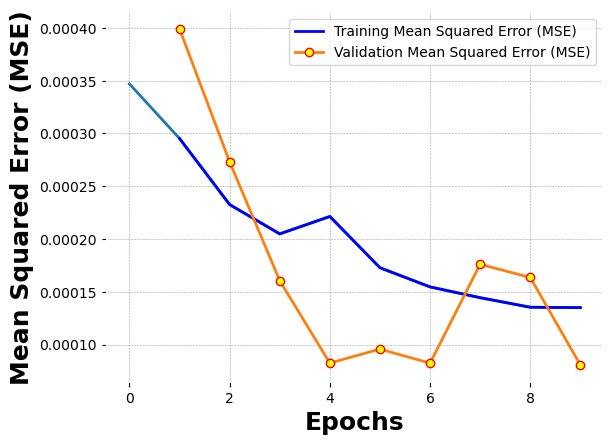

In [42]:
# showing graph for mse or mae
plt.plot(history.history['loss'])
plt.xlabel('Mean Squared Error', size = 14)


# showing detaild graph for training and validation mse and mae

history_dict = history.history

mse_values = history_dict['loss'][1:]
val_mse_values = history_dict['val_loss'][1:]

epochs = range(1, len(mse_values) + 1)
plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, mse_values, 'b', label='Training Mean Squared Error (MSE)')
plt.plot(epochs, val_mse_values, marker='o', markeredgecolor='red', markerfacecolor='yellow', label='Validation Mean Squared Error (MSE)')
plt.xlabel('Epochs', size=18)
plt.ylabel('Mean Squared Error (MSE)', size=18)
plt.legend()
plt.show()

In [43]:
# use model on test data to predict
pred = CNN_saved_best_model(x_test)
print(pred)

tf.Tensor(
[[0.6277034  0.6226178 ]
 [0.6267184  0.6211267 ]
 [0.6292686  0.62400174]
 ...
 [0.58942676 0.5831821 ]
 [0.5889612  0.58281404]
 [0.588586   0.58254737]], shape=(2995, 2), dtype=float32)


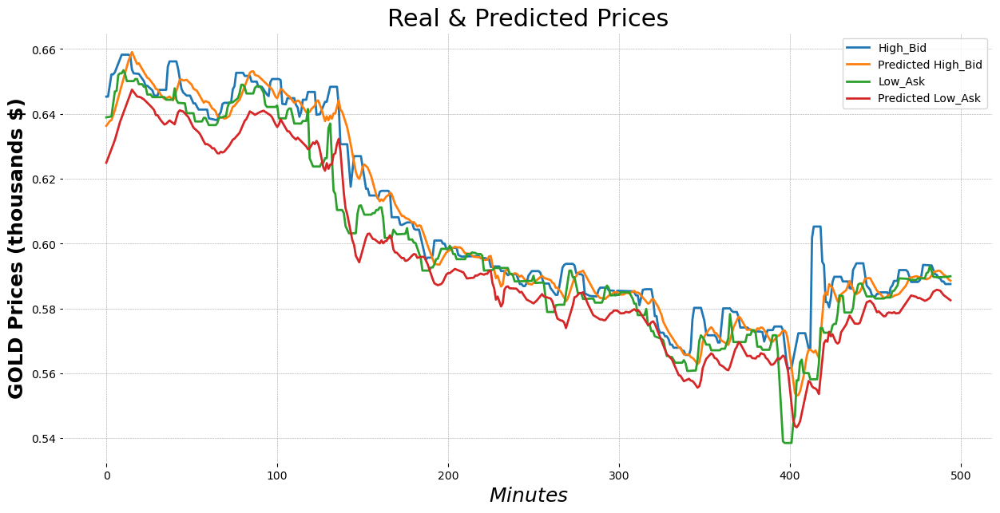

In [44]:
# plotting the real and predicted price 
N1=2500  # The first minute for the chart  
LL = 500  # Duration (in minutes) for the chart
N2=N1+LL  # the last minute for the chart

plt.ion()
fig = plt.figure(figsize=(15,7))  

ax1 = fig.add_subplot(111)
line1, = ax1.plot(y_test[N1:N2,0], label='High_Bid')
line2, = ax1.plot(pred[N1:N2,0], label='Predicted High_Bid')
line3, = ax1.plot(y_test[N1:N2,1], label='Low_Ask')
line4, = ax1.plot(pred[N1:N2,1], label='Predicted Low_Ask')

plt.title('Real & Predicted Prices', size=22)
plt.ylabel('GOLD Prices (thousands $)', size=18)
plt.xlabel('$Minutes$', size=18)
plt.legend(loc='upper right') 

plt.show()
